In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, filters
from ipywidgets import interactive, IntSlider, Output

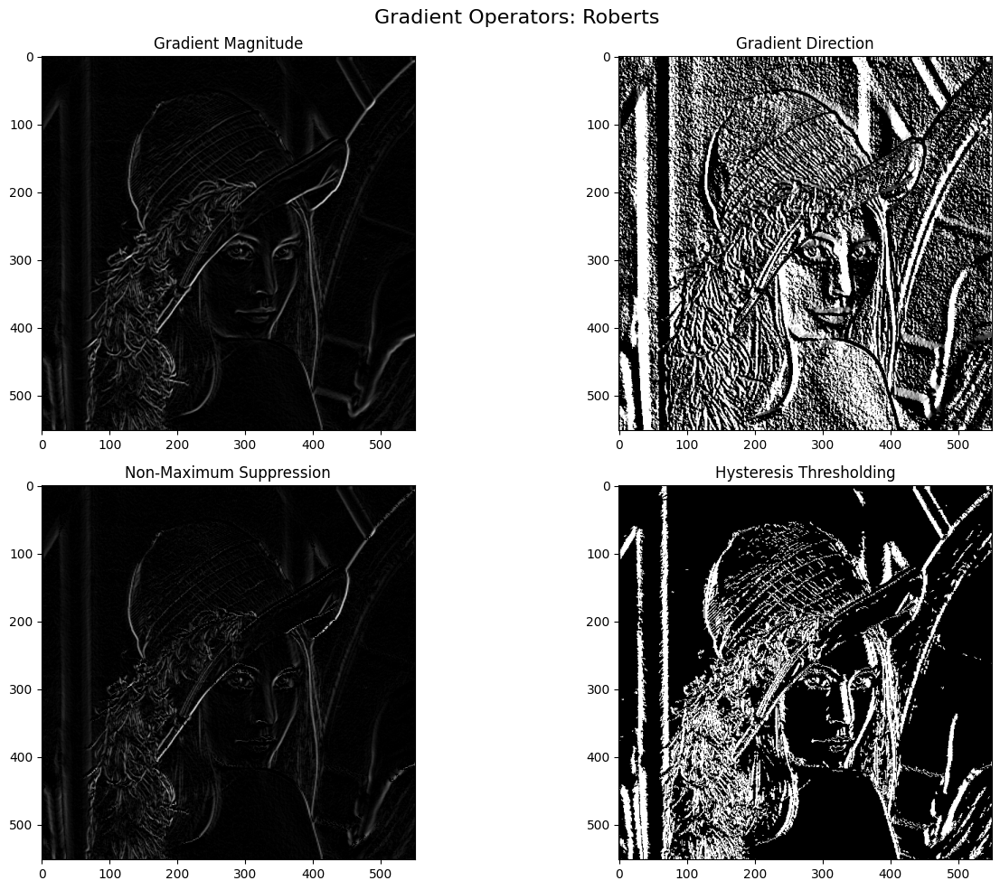

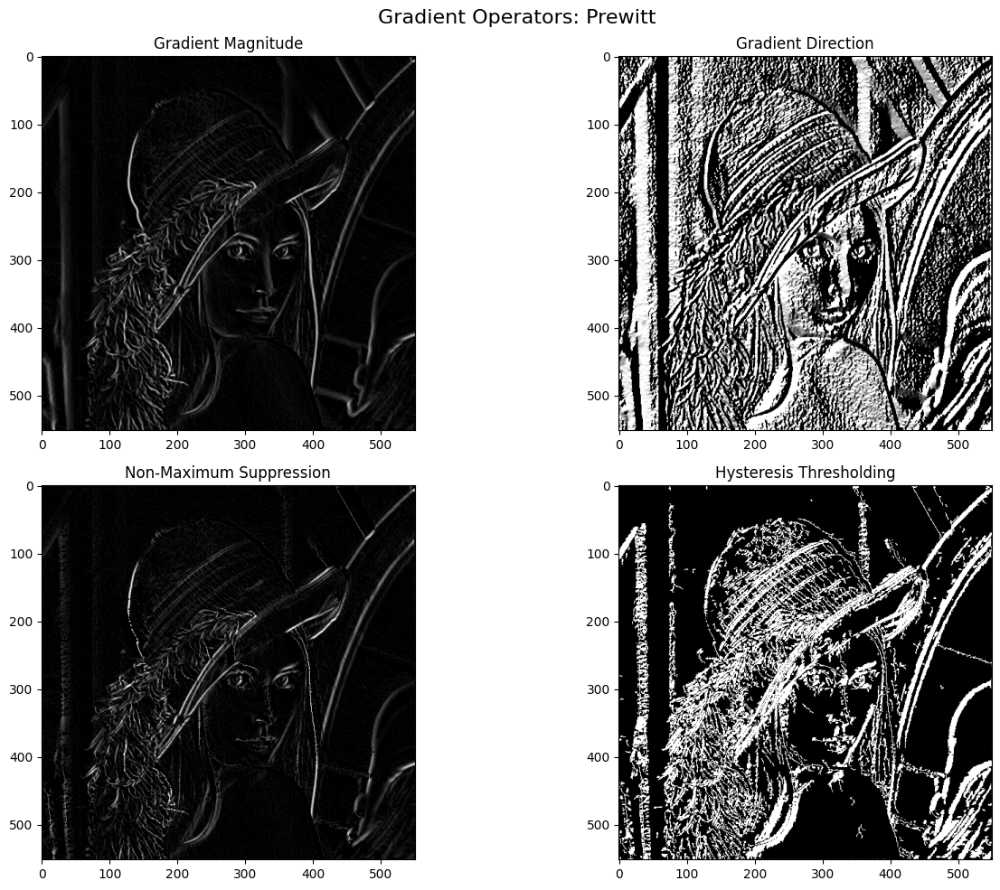

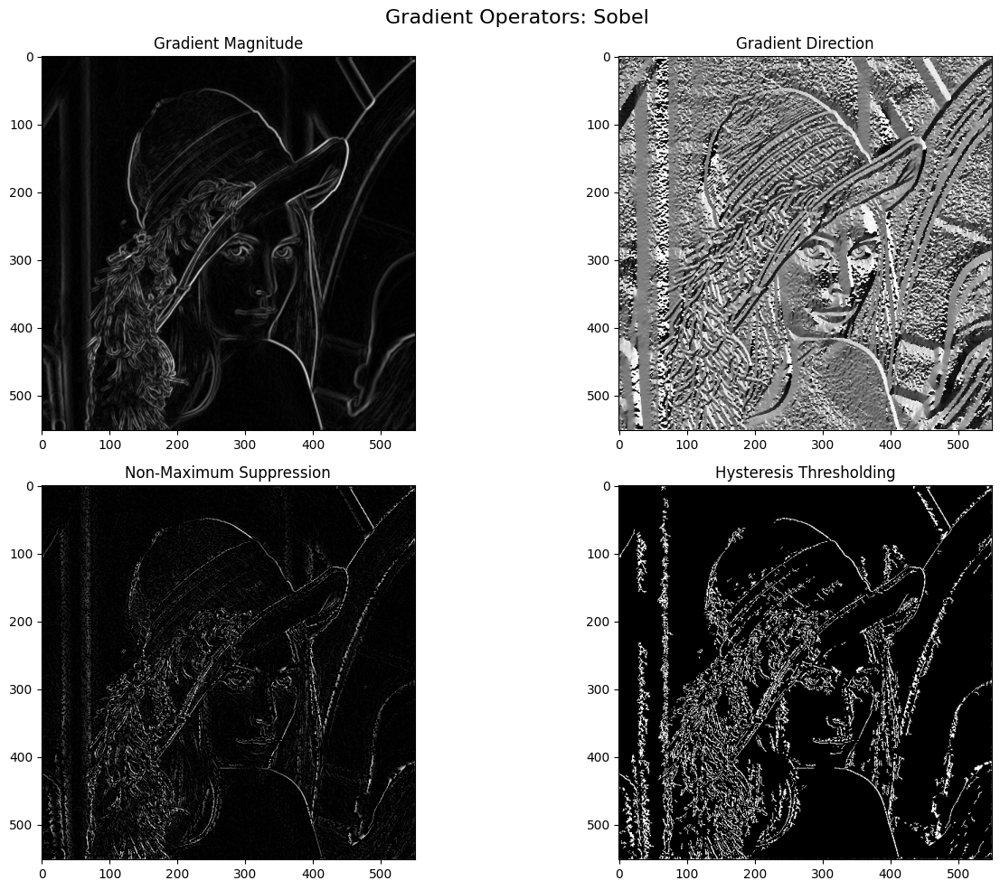

In [2]:
def local_maxima_extraction(Gx, Gy, N_G):
    l, c = Gx.shape
    GM_1 = np.zeros((l - 2, c - 2), dtype=np.float32)
    GM_2 = np.zeros((l - 2, c - 2), dtype=np.float32)
    G = np.copy(N_G)
    
    for i in range(1, l - 1):
        for j in range(1, c - 1):
            gx = Gx[i, j]
            gy = Gy[i, j]
            
            if gy != 0 and gx != 0:
                if gx > gy:
                    GM_1[i - 1, j - 1] = (gy / gx) * N_G[i - 1, j] + ((gx - gy) / gx) * N_G[i - 1, j + 1]
                    GM_2[i - 1, j - 1] = (gy / gx) * N_G[i + 1, j - 1] + ((gx - gy) / gx) * N_G[i + 1, j]
                else:
                    GM_1[i - 1, j - 1] = (gx / gy) * N_G[i, j + 1] + ((gy - gx) / gy) * N_G[i - 1, j + 1]
                    GM_2[i - 1, j - 1] = (gx / gy) * N_G[i, j - 1] + ((gy - gx) / gy) * N_G[i + 1, j - 1]
                    
                if G[i, j] <= GM_1[i - 1, j - 1] or G[i, j] <= GM_2[i - 1, j - 1]:
                    G[i, j] = 0
                
    return G.astype(np.uint8)

def hysteresis_thresholding(non_maximum, high_threshold, low_threshold):
    M, N = non_maximum.shape
    out = np.zeros((M, N), dtype=np.uint8)

    strong_i, strong_j = np.where(non_maximum >= high_threshold)
    weak_i, weak_j = np.where((non_maximum >= low_threshold) & (non_maximum < high_threshold))
    zeros_i, zeros_j = np.where(non_maximum < low_threshold)

    out[strong_i, strong_j] = 255
    out[zeros_i, zeros_j] = 0
    out[weak_i, weak_j] = 75

    for i in range(1, M - 1):
        for j in range(1, N - 1):
            if out[i, j] == 75:
                if 255 in [out[i + 1, j - 1], out[i + 1, j], out[i + 1, j + 1],
                           out[i, j - 1], out[i, j + 1],
                           out[i - 1, j - 1], out[i - 1, j], out[i - 1, j + 1]]:
                    out[i, j] = 255
                else:
                    out[i, j] = 0

    return out

def process_image(img_x, img_y, highThres, lowThres, title):
    norme = np.hypot(img_x, img_y)
    theta = np.arctan2(img_y, img_x)
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(title, fontsize=16)
    
    axes[0, 0].imshow(norme, cmap="gray")
    axes[0, 0].set_title("Gradient Magnitude")
    
    axes[0, 1].imshow(theta, cmap="gray")
    axes[0, 1].set_title("Gradient Direction")
    
    Non_Maximum = local_maxima_extraction(img_x, img_y, norme)
    axes[1, 0].imshow(Non_Maximum, cmap="gray")
    axes[1, 0].set_title("Non-Maximum Suppression")
    
    out = hysteresis_thresholding(Non_Maximum, highThres, lowThres)
    axes[1, 1].imshow(out, cmap="gray")
    axes[1, 1].set_title("Hysteresis Thresholding")
    
    plt.tight_layout()
    plt.show()

image_path = r'C:\Users\Yassine\Desktop\git\Segm\TPs_Segmentation\Lena.png'
I = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

###################################### Roberts Gradient ########################################################
kernelxr = np.array([[1, 0], [0, -1]])
kernelyr = np.array([[0, 1], [-1, 0]])
img_robertx = cv.filter2D(I, -1, kernelxr)
img_roberty = cv.filter2D(I, -1, kernelyr)
process_image(img_robertx, img_roberty, 7, 5, "Gradient Operators: Roberts")

###################################### Prewitt Gradient ########################################################
kernelxp = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
kernelyp = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
img_prewittx = cv.filter2D(I, -1, kernelxp)
img_prewitty = cv.filter2D(I, -1, kernelyp)
process_image(img_prewittx, img_prewitty, 20, 10, "Gradient Operators: Prewitt")

###################################### Sobel Gradient ########################################################
img_sobelx = cv.Sobel(I, cv.CV_32F, 1, 0, ksize=3)
img_sobely = cv.Sobel(I, cv.CV_32F, 0, 1, ksize=3)
process_image(img_sobelx, img_sobely, 60, 10, "Gradient Operators: Sobel")


## Multidirectional Gradient Operators

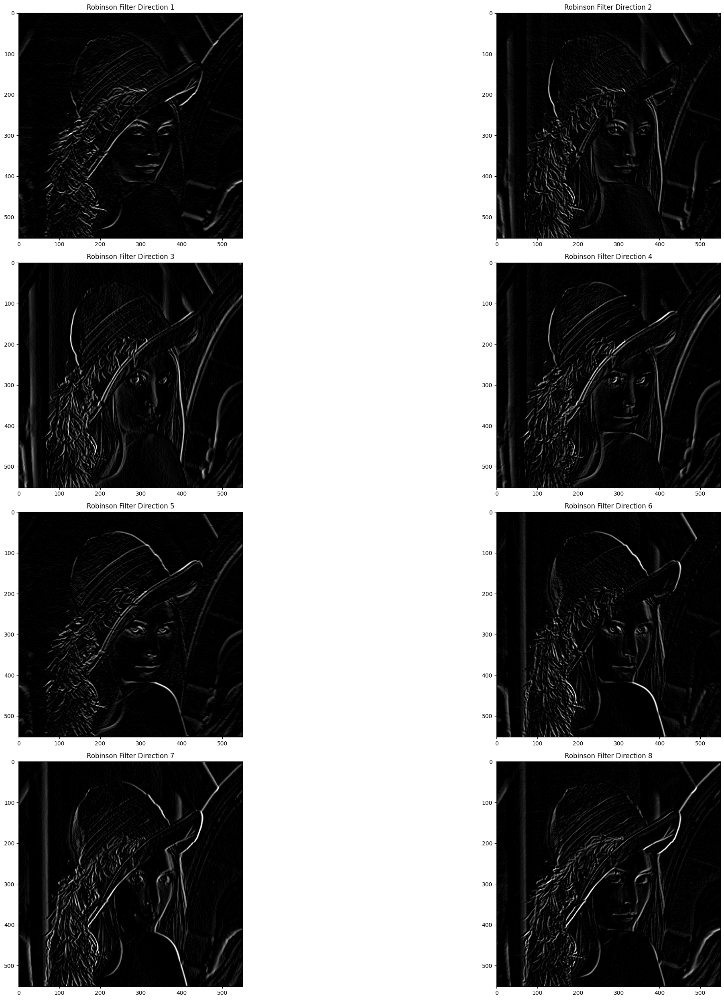

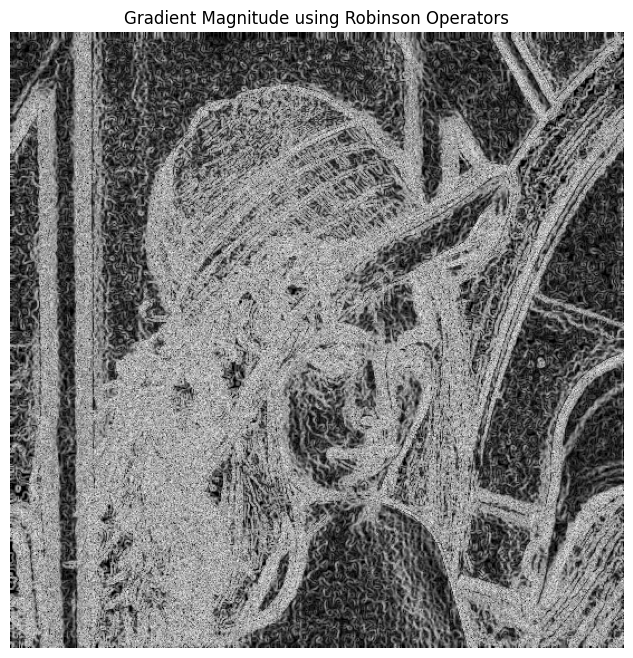

In [3]:
                                                                # Load your image here
image_path = r'C:\Users\Yassine\Desktop\git\Segm\TPs_Segmentation\Lena.png'
I = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

# Define Robinson gradient operators
operators = [
    np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]),
    np.array([[0, 1, 1], [-1, 0, 1], [-1, -1, 0]]),
    np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]),
    np.array([[-1, -1, 0], [-1, 0, 1], [0, 1, 1]]),
    np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]),
    np.array([[0, -1, -1], [1, 0, -1], [1, 1, 0]]),
    np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]]),
    np.array([[1, 1, 0], [1, 0, -1], [0, -1, -1]])
]

# Apply Robinson filters and store results
Robinson = [cv.filter2D(I, -1, op) for op in operators]

# Plot the results in a grid
plt.figure(figsize=(30, 25))

for i in range(len(Robinson)):
    plt.subplot(4, 2, i + 1)
    plt.imshow(Robinson[i], cmap="gray")
    plt.title(f"Robinson Filter Direction {i + 1}")

plt.tight_layout()
plt.show()

norme = np.sqrt(np.sum(np.square(Robinson), axis=0))

# Display the gradient magnitude image
plt.figure(figsize=(10, 8))
plt.imshow(norme, cmap='gray')
plt.title("Gradient Magnitude using Robinson Operators")
plt.axis('off')
plt.show()

## Canny Edge Detection with a interactive widgets for thresholds

In [5]:

def Canny_interactive(I):
    # Define a function to perform Canny edge detection
    def apply_canny(threshold1, threshold2):
        edges = cv.Canny(I, threshold1, threshold2)
        plt.figure(figsize=(8, 6))
        plt.imshow(edges, cmap='gray')
        plt.title('Canny Edge Detection')
        plt.axis('off')
        plt.show()

    # Create interactive widgets for thresholds
    threshold1_slider = IntSlider(min=0, max=255, step=1, description='Threshold1')
    threshold2_slider = IntSlider(min=0, max=255, step=1, description='Threshold2')
    
    # Link widgets to the function using interactive
    interactive_plot = interactive(apply_canny, threshold1=threshold1_slider, threshold2=threshold2_slider)
    output = interactive_plot.children[-1]
    output.layout.height = '400px'
    
    # Display the interactive plot
    display(interactive_plot)

# Example usage:
image_path = r'C:\Users\Yassine\Desktop\git\Segm\TPs_Segmentation\Lena.png'
I = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

if I is not None:
    Canny_interactive(I)
else:
    print(f"Error: Could not load image from {image_path}")


interactive(children=(IntSlider(value=0, description='Threshold1', max=255), IntSlider(value=0, description='T…

### Image Segmentation Using K-means Clustering

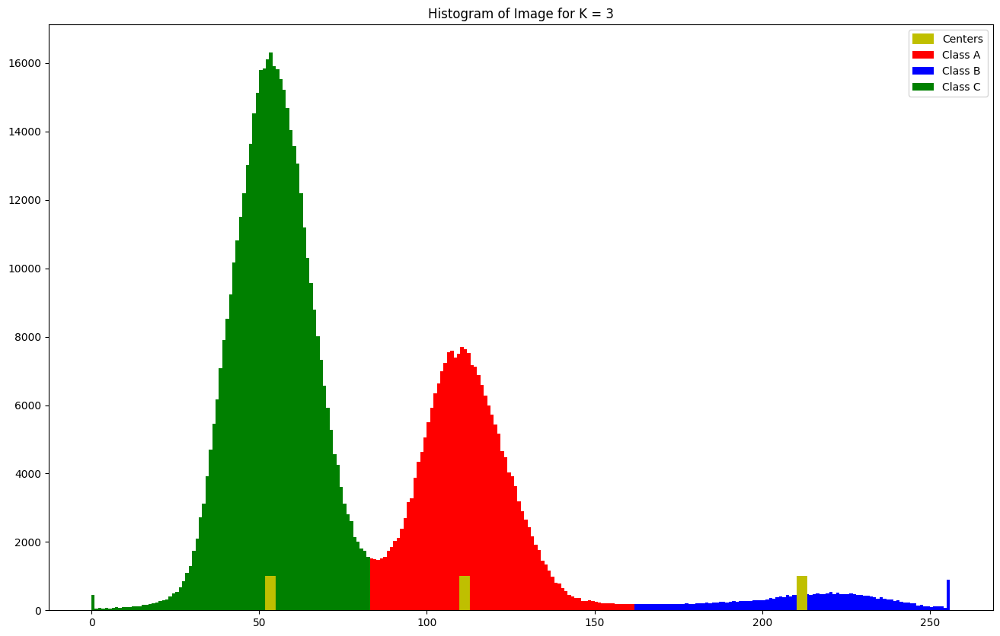

In [14]:
# Path to your image
image_path = r'C:\Users\Yassine\Desktop\git\Segm\TPs_Segmentation\foot.jpg'

img = cv.imread(image_path)

if img is None:
    print(f"Error: Could not load image from {image_path}")
else:
    # Convert the image to float32 format for K-means clustering
    tab = np.float32(img.ravel().reshape(-1,1))

    # Define criteria for K-means
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)

    # Number of clusters (K)
    k = 3

    # Number of attempts for K-means algorithm
    attempts = 10

    compactness, labels, centers = cv.kmeans(tab, k, None, criteria, attempts, cv.KMEANS_RANDOM_CENTERS)

    # Separate points into different classes based on labels
    A = tab[labels==0]
    B = tab[labels==1]
    C = tab[labels==2]

    plt.figure(figsize=(16, 10))

    plt.vlines(centers, ymin=0, ymax=1000, color='y', linestyle='-', linewidth=10, label="Centers")

    plt.hist(A, 256, [0, 256], color='r', label="Class A")
    plt.hist(B, 256, [0, 256], color='b', label="Class B")
    plt.hist(C, 256, [0, 256], color='g', label="Class C")

    plt.title("Histogram of Image for K = 3")
    plt.legend()

    plt.show()


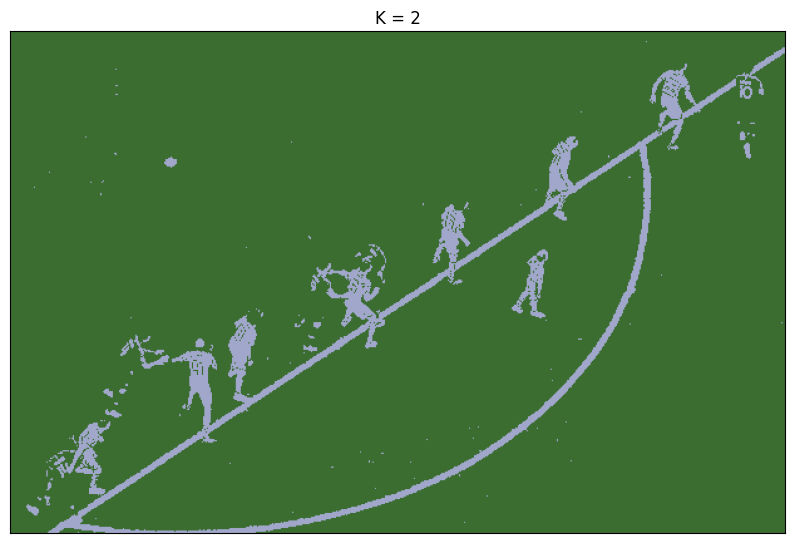

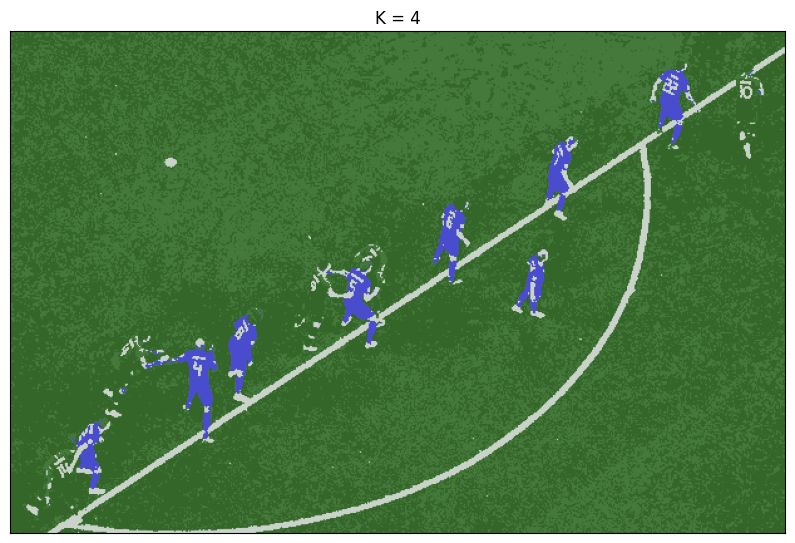

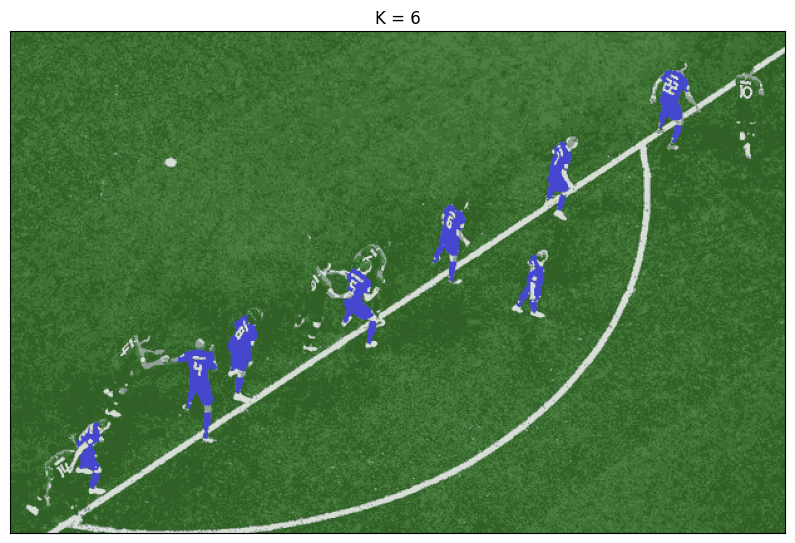

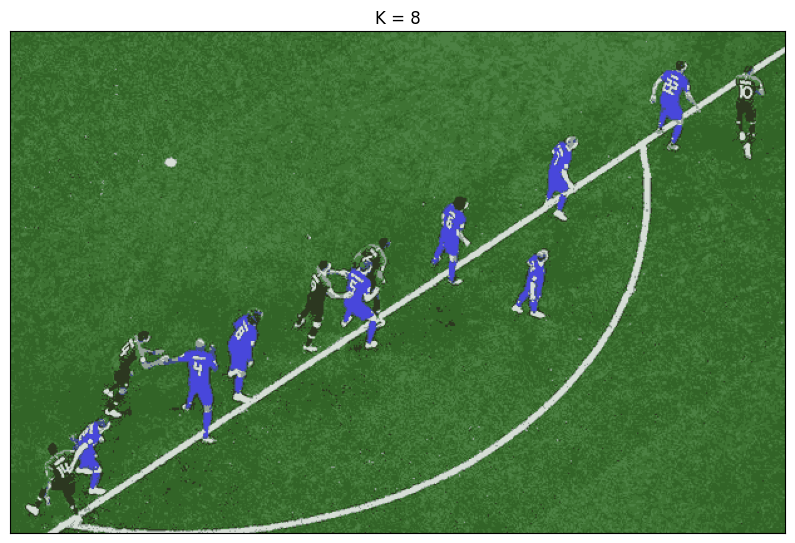

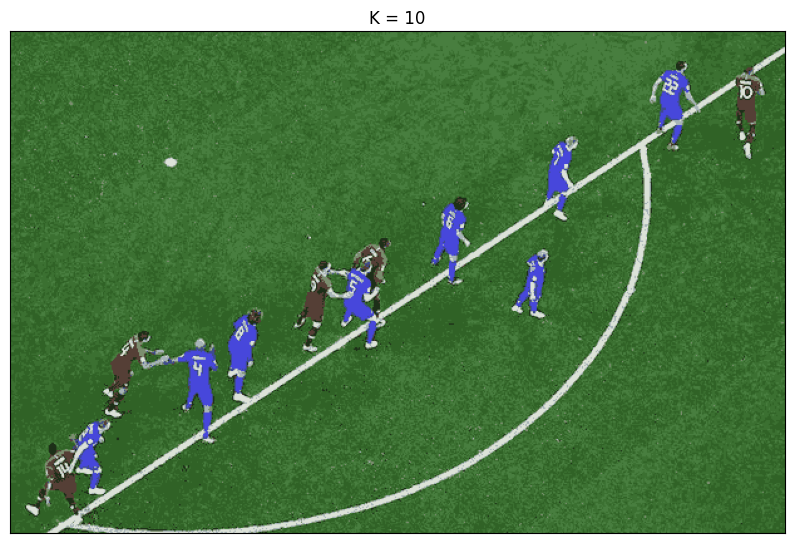

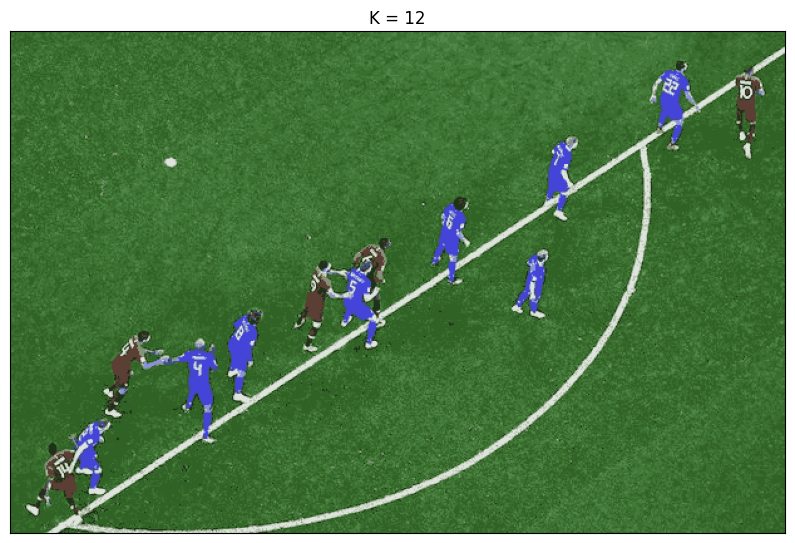

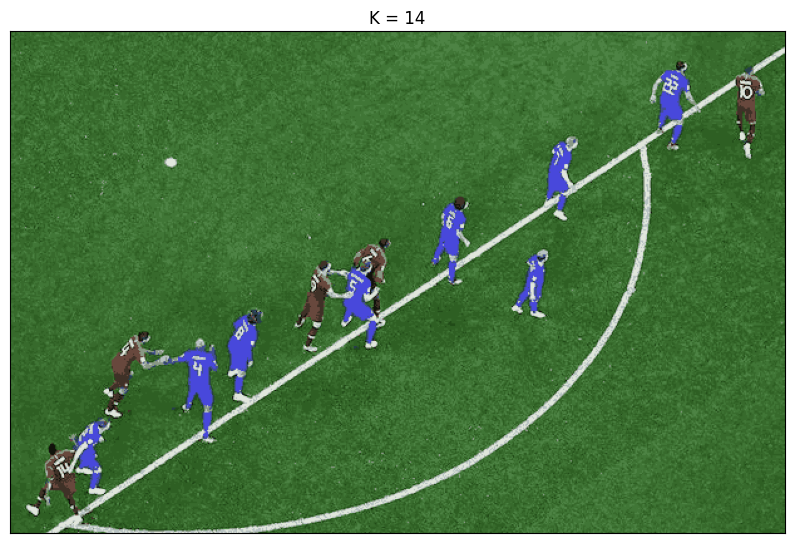

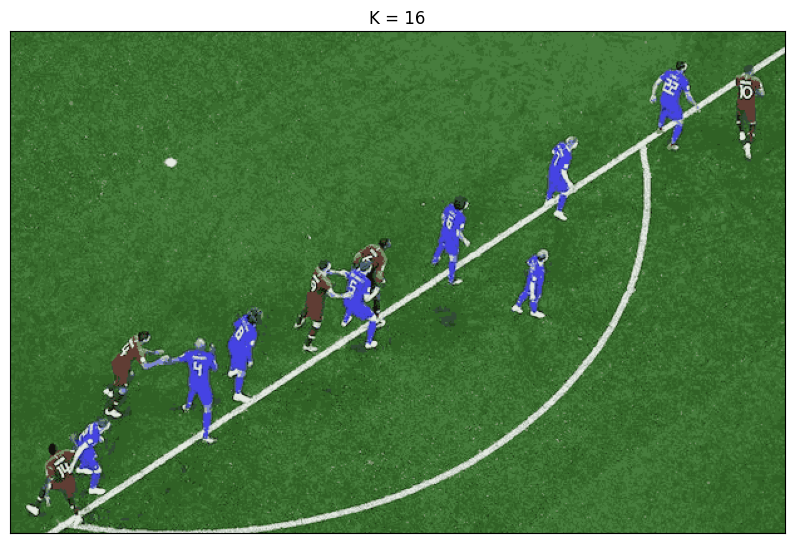

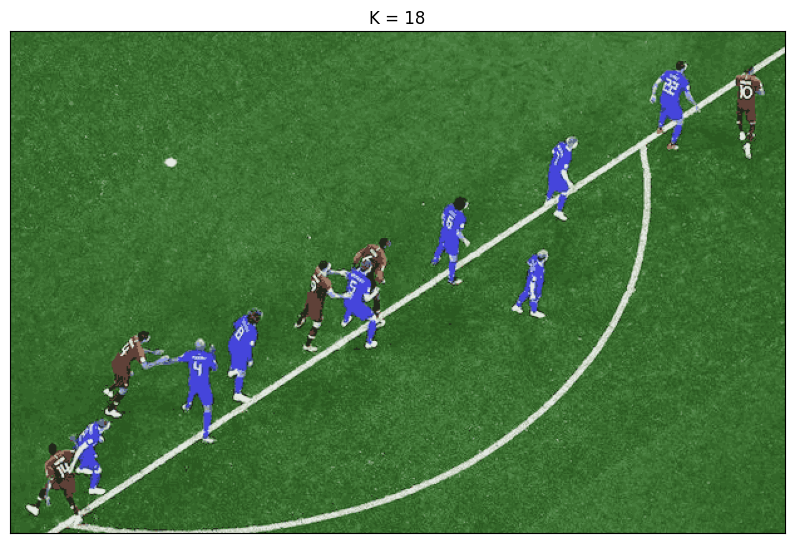

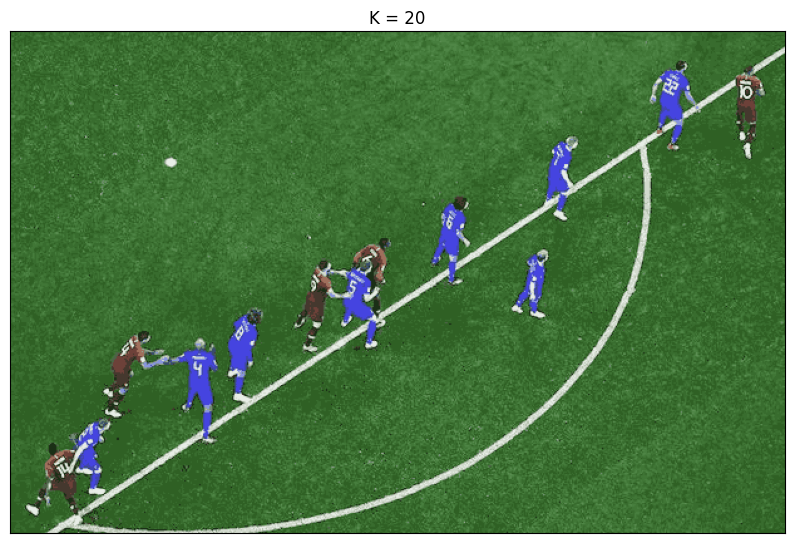

In [11]:
Z = img.reshape((-1,3))
# convert to np.float32
Z = np.float32(Z)
# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)

res2 = []
for i in range(2,22,2):
    K = i
    ret,label,center=cv.kmeans(Z,K,None,criteria,10,cv.KMEANS_RANDOM_CENTERS)
    # Now convert back into uint8, and make original image
    center = np.uint8(center)
    res = center[label.flatten()]
    res2.append(res.reshape((img.shape)))
    
    plt.figure(figsize=(10,7))
    plt.imshow(res2[i//2-1])
    plt.title("K = {}".format(K))
    plt.xticks([]),plt.yticks([])    
    plt.show()